In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_masks.npy')

In [3]:
X_test = images[1744:2180]
y_test = masks[1744:2180]

In [4]:
images = images[0:1744]
masks = masks[0:1744]

In [5]:
images.shape

(1744, 512, 512, 1)

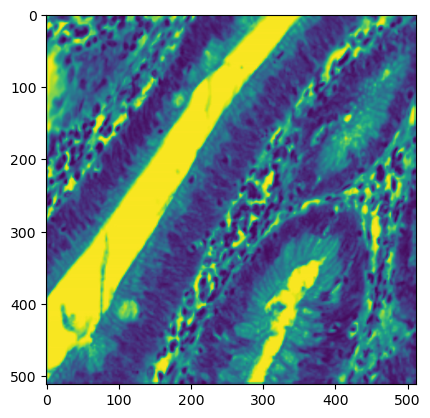

In [6]:
imshow(images[100])

In [7]:
masks.shape

(1744, 512, 512, 1)

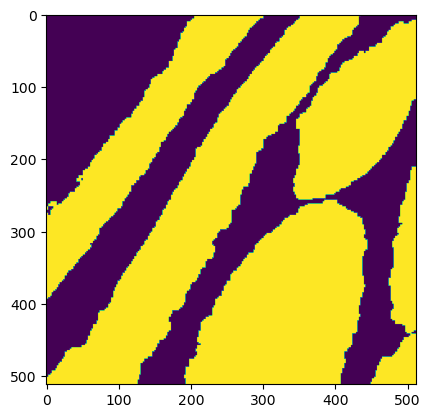

In [8]:
imshow(masks[100])

In [9]:
import sys
sys.path.append('../')
import gp2

In [10]:
from keras import losses

In [11]:
loss_fx = losses.BCE

In [12]:
C = gp2.KUC_UNet2D(loss=loss_fx, model_path='/tmp/tmppqo2n2sgkuc_unet2d/kuc_unet2d_0kuc_unet2d_model')

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpfe6q1_ptkuc_unet2d


In [13]:
from runner import Runner
R = Runner(verbose=True, workingdir=C.workingdir)

*** GP2 ***
Working directory: /tmp/tmpfe6q1_ptkuc_unet2d
Verbose mode active!


In [14]:
R.classifier = C ### use custom classifier

In [15]:
R.run(images, masks, runs=10, batch_size=16, shuffle=True, results_file='/raid/mpsych/OMAMA/GP2/results/kuc_unet2d_0kuc_unet2d_model_1_10_EBHI.pkl')

Shuffling data...
Weights OK!
******
Loop 1
Epoch 1/100
6/6 [==============================] - 20s 2s/step - loss: 0.3025 - dice_coeff: 0.8626 - val_loss: 0.3508 - val_dice_coeff: 0.8157
Epoch 2/100
6/6 [==============================] - 3s 522ms/step - loss: 0.3092 - dice_coeff: 0.8512 - val_loss: 0.3000 - val_dice_coeff: 0.8723
Epoch 3/100
6/6 [==============================] - 3s 479ms/step - loss: 0.2877 - dice_coeff: 0.8677 - val_loss: 0.2892 - val_dice_coeff: 0.8681
Epoch 4/100
6/6 [==============================] - 3s 492ms/step - loss: 0.2779 - dice_coeff: 0.8767 - val_loss: 0.2885 - val_dice_coeff: 0.8659
Epoch 5/100
6/6 [==============================] - 3s 488ms/step - loss: 0.2703 - dice_coeff: 0.8749 - val_loss: 0.2904 - val_dice_coeff: 0.8765
Epoch 6/100
6/6 [==============================] - 3s 491ms/step - loss: 0.2666 - dice_coeff: 0.8813 - val_loss: 0.2893 - val_dice_coeff: 0.8756
Epoch 7/100
6/6 [==============================] - 3s 488ms/step - loss: 0.2670 - dice_c

4/4 [==============================] - 0s 29ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Found 54 machine labels.
Replacing 18 from 54 !
D_relabeled_ 18
point ids 18
Removed: 18 Filled: 18
TOOK 96.74330306053162 seconds
==== DONE LOOP 5 ====
******
Loop 6
Epoch 1/100
11/11 [==============================] - 9s 844ms/step - loss: 0.2859 - dice_coeff: 0.8713 - val_loss: 0.2873 - val_dice_coeff: 0.8713
Epoch 2/100
11/11 [==============================] - 4s 374ms/step - loss: 0.2883 - dice_coeff: 0.8745 - val_loss: 0.2878 - val_dice_coeff: 0.8624
Epoch 3/100
11/11 [==============================] - 4s 372ms/step - loss: 0.2842 - dice_coeff: 0.8718 - val_loss: 0.2899 - val_dice_coeff: 0.8703
Epoch 4/100
11/11 [==============================] - 4s 371ms/step - loss: 0.2916 - dice_coeff: 0.8676 - val_loss: 0.2926 - val_dice_coeff: 0.8574
Epoch 5/100
11/11 [==============================] - 4s 369ms/step - loss: 0.2850 - dice_coeff: 0.8726 - val_loss: 0.2942 - val_dice_coeff: 0.8563
Model sa

In [16]:
R.classifier_scores

[[0.3208988904953003, 0.8652313351631165],
 [0.3447059094905853, 0.8409695029258728],
 [0.32613125443458557, 0.8596276044845581],
 [0.3080606758594513, 0.8675053119659424],
 [0.3100309371948242, 0.8695545792579651],
 [0.3111889064311981, 0.8523374199867249],
 [0.30553412437438965, 0.862182080745697],
 [0.3147518038749695, 0.8633283376693726],
 [0.3043709993362427, 0.8601951003074646],
 [0.3033382296562195, 0.8679400086402893]]

In [17]:
R.discriminator_scores

[[0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0]]

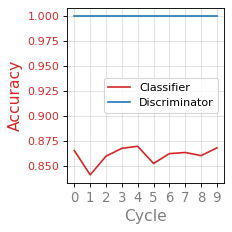

In [18]:
R.plot()

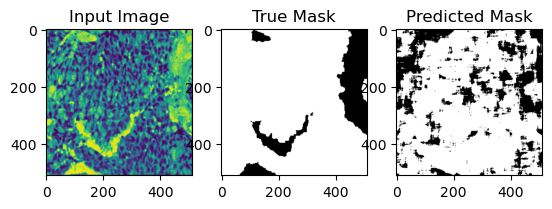

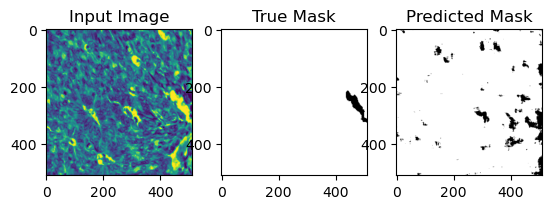

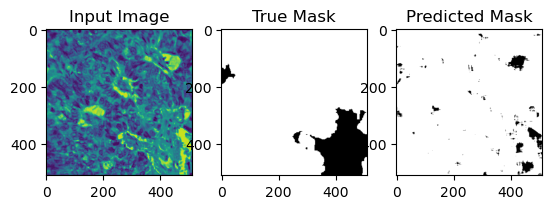

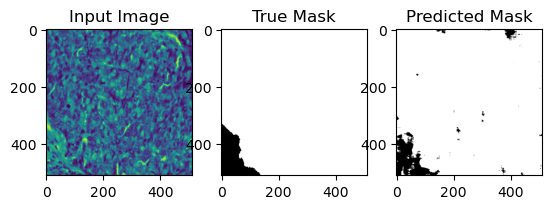

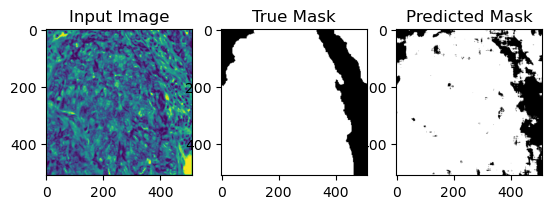

...

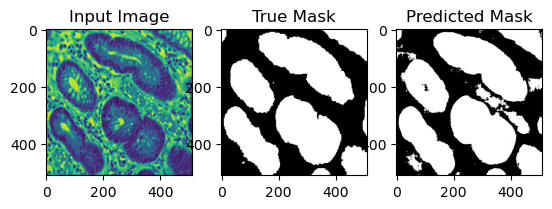

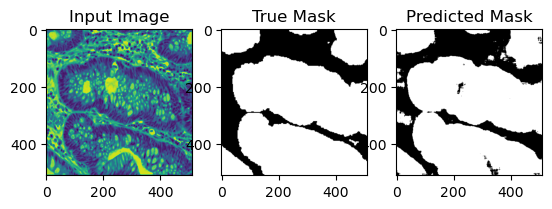

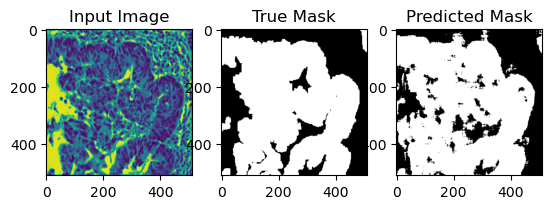

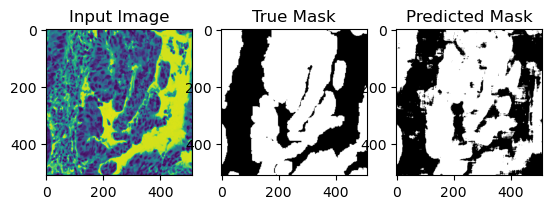

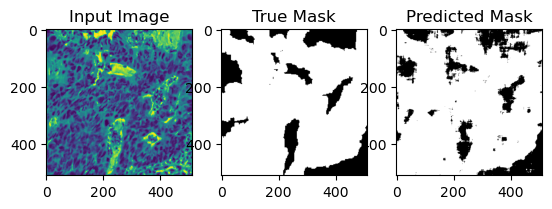

In [19]:
gp2.Util.visualize_predictions(C, X_test, y_test, num_samples=100)

In [20]:
y_pred = R.classifier.predict(X_test, y_test)

In [21]:
y_pred

(array([[[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         ...,
 
         [[0.],
          [0.],
          [0.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [1.],
          [1.],
          [1.]]],
 
 
        [[[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
      

In [22]:
BareBone = gp2.KUC_UNet2D(loss=loss_fx, model_path='/tmp/tmppqo2n2sgkuc_unet2d/kuc_unet2d_0kuc_unet2d_model')

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpfe6q1_ptkuc_unet2d


In [23]:
barebone_pred = BareBone.predict(X_test, y_test)

In [24]:
barebone_pred

(array([[[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         ...,
 
         [[0.],
          [0.],
          [0.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [1.],
          [1.],
          [1.]]],
 
 
        [[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
      

In [25]:
BareBone.model.metrics_names

['loss', 'dice_coeff']